In [43]:
# Data Manuiplation dependencies
# https://numpy.org/
import numpy as np
# https://pandas.pydata.org/
import pandas as pd 
#----------------------------------
# Visualisations dependencies
# https://matplotlib.org/
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
#https://seaborn.pydata.org/
import seaborn as sns
#-------------------------------------
import warnings
import itertools
import os
#--------------------------------
sns.set(style="darkgrid")
# Modelling dependencies
#sklearn Dependencies
# All dependencies can be found here https://scikit-learn.org/stable/
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import roc_auc_score,confusion_matrix, classification_report

# Ignore warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 90) # display all column of dataframe
pd.set_option('display.max_row', 100)
#-----------------------------------------------------------------------

# Table of Contents

   * EDA
        
     * For Classes 0 and 1
        * Splitting and standardizing data for analysis

        * Random Forest Model with Test Data
            * Random Forest Feature selection

        * Random Forest Model with Validation Data
        
        * Logisitc feature importance
        
        * PCA feature selection
    

# EDA 

In [44]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)        


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [45]:
def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

In [46]:
# import data and clean it
df = pd.read_csv('Contextual_Features.csv')
df.drop(['long','lat','Point'],axis=1,inplace=True)
#df.set_index(['long','lat'],inplace=True)
#del df['Band_28'] # Band 28 did not have any values within it
print('there are ', df.shape[0],'values in the original dataframe')
df.head()

there are  47560 values in the original dataframe


,Label,lbpm_sc3_kurtosis,lbpm_sc3_max,lbpm_sc3_mean,lbpm_sc3_skew,lbpm_sc3_variance,lbpm_sc5_kurtosis,lbpm_sc5_max,lbpm_sc5_mean,lbpm_sc5_skew,lbpm_sc5_variance,lbpm_sc7_kurtosis,lbpm_sc7_max,lbpm_sc7_mean,lbpm_sc7_skew,lbpm_sc7_variance,lsr_sc31_line_contrast,lsr_sc31_line_length,lsr_sc31_line_mean,lsr_sc51_line_contrast,lsr_sc51_line_length,lsr_sc51_line_mean,lsr_sc71_line_contrast,lsr_sc71_line_length,lsr_sc71_line_mean,ndvi_sc3_mean,ndvi_sc3_variance,ndvi_sc5_mean,ndvi_sc5_variance,ndvi_sc7_mean,ndvi_sc7_variance,orb_sc31_kurtosis,orb_sc31_max,orb_sc31_mean,orb_sc31_skew,orb_sc31_variance,orb_sc51_kurtosis,orb_sc51_max,orb_sc51_mean,orb_sc51_skew,orb_sc51_variance,orb_sc71_kurtosis,orb_sc71_max,orb_sc71_mean,orb_sc71_skew,...,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance
0,0,153.398791,5.02,0.498818,19.144339,1.217022,7.940662,11.16,1.220501,2.027661,5.317961,0.911802,18.85,2.372134,0.398236,14.405029,2.161797,2.151055,1.000134,3.079660,3.158707,1.037654,3.791711,3.895024,0.973391,0.312586,0.002839,0.206390,0.023505,0.154050,0.045298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.054567,12.812452,1.000160,1.078044,13.206928,1.101271,13.213200,1.090952,13.171909,1.104067,13.064172,13.071736,1.031351,9.006027,27.319756,8.585666,25.676215,8.339256,24.671701,28.540172,9.085556,28.771785,9.135659,28.932851,9.055790,28.344580,8.896418,8.872528,27.892429,6.955875,61.095016,6.392970,54.379296,5.977051,49.821317,66.503494,6.985219,64.757161,7.080777,65.843166,7.078786,66.102310,6.811213,6.816379,65.199223
1,0,196.433558,6.29,0.441782,21.841225,1.271096,7.418572,16.20,1.214437,1.773921,7.223426,0.698769,31.08,2.371745,0.295401,23.835093,1.809051,1.831827,0.835521,2.932289,3.096902,1.015008,3.584475,3.758436,1.103619,0.498261,0.000574,0.328948,0.036528,0.243649,0.077184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.301162,9.695759,0.309521,0.330559,9.694598,0.311350,9.707718,0.312207,9.739708,0.317548,9.699286,9.719076,0.335256,6.352775,13.760616,6.360666,13.766438,6.338096,13.717682,13.829015,6.332522,13.703470,6.360144,13.770915,6.377326,13.835602,6.362715,6.364544,13.912990,4.682027,28.706225,4.699450,28.828380,4.697201,28.915879,28.734477,4.648913,28.174815,4.690323,28.520097,4.666482,28.223428,4.696986,4.661414,28.588518
2,0,179.113675,5.87,0.439786,21.129914,1.179706,6.447273,14.53,1.212454,1.688199,6.503417,0.605517,28.07,2.371356,0.281807,22.210624,1.898158,1.905103,0.974359,2.979634,3.105585,1.048742,3.683048,3.828014,1.131314,0.319638,0.002933,0.209330,0.024486,0.154652,0.046360,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.397309,8.669246,0.383954,0.415342,8.683183,0.372648,8.736687,0.364507,8.748939,0.364702,8.762431,8.600819,0.406601,5.767524,12.092370,5.855174,12.078048,5.853087,12.048413,11.592570,5.822627,11.713184,5.901166,12.052198,5.922033,12.114768,5.912086,5.700343,11.428006,4.324014,26.713944,4.416996,26.350820,4.397066,26.102161,25.325623,4.414195,25.799741,4.507040,26.599272,4.520779,26.931343,4.487313,4.227843,24.898392
3,0,227.973282,4.78,0.450893,25.921663,0.936733,9.041996,11.68,1.210669,2.256273,4.715903,0.933094,22.78,2.370968,0.398171,15.653240,2.084190,2.100649,

In [47]:
# create pie chart data
pie_data= count_values_in_column(df,"Label") # save data aS a dataframe
count_values_in_column(df,"Label")

,Total,Percentage
2,32089,67.47
0,15202,31.96
1,269,0.57


<function matplotlib.pyplot.show(close=None, block=None)>

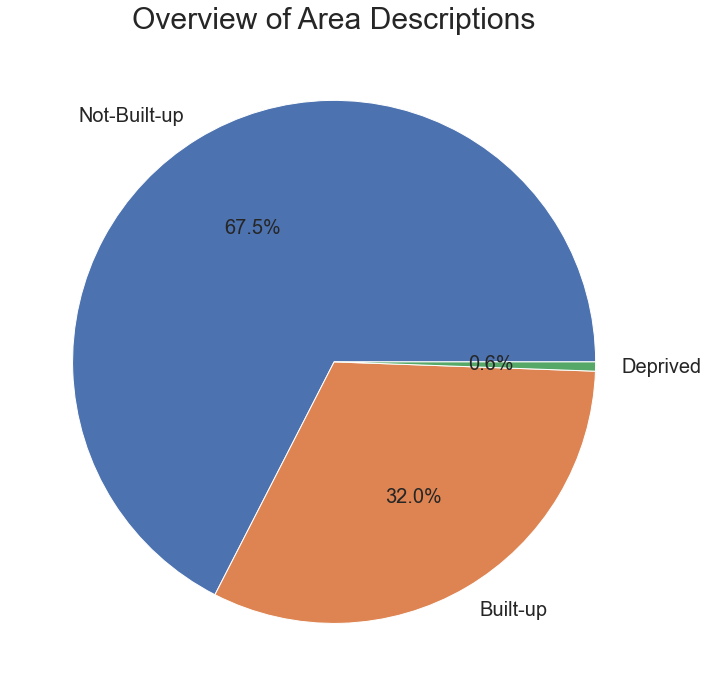

In [48]:
plt.figure(figsize= (10,10))
labels = ['Not-Built-up','Built-up', 'Deprived']
plt.title('Overview of Area Descriptions', fontsize=30)
plt.pie(pie_data['Total'], labels=labels, autopct='%1.1f%%', textprops={'fontsize': 20})
plt.rcParams["axes.labelweight"] = "bold"
plt.tight_layout()
plt.show

In [49]:
#checking NAN on Contextual data values
null_values = df[df.isnull().any(axis=1)]
print('there are',df[df.isnull().any(axis=1)].shape[0], 'nan values in the dataframe')
print(null_values['Label'].value_counts())
df.dropna(inplace=True)
print('there are ',df.shape[0],'rows of data after removing nan values')

there are 0 nan values in the dataframe
Series([], Name: Label, dtype: int64)
there are  47560 rows of data after removing nan values


In [50]:
# Some Useful Functions
def Distribution_plot(dataframe,feature, target, title, xlabel):
    """"
    Plot Distribution of feature for both classes
    
    Parameters
    ------------
    dataframe: Training dataframe
    feature: Variable to find distribution
    target: Dependent variable column containing all classes
    title: Plot title
    """
    
    # set the figure size
    plt.figure(figsize=(10,8))

    ax = plt.subplot()
    #distribution plot for all classes
    sns.distplot(dataframe[feature][dataframe[target] == 0], bins=50, label="Deprived Area")
    sns.distplot(dataframe[feature][dataframe[target] ==1], bins=50, label="Developed Area")
    sns.distplot(dataframe[feature][dataframe[target] ==2], bins=50, label="Water Area")

    plt.title(title, fontsize=14)
    plt.xlabel(xlabel)

    # Add legend and show plot
    ax.legend(title="Area classification")
    plt.show()

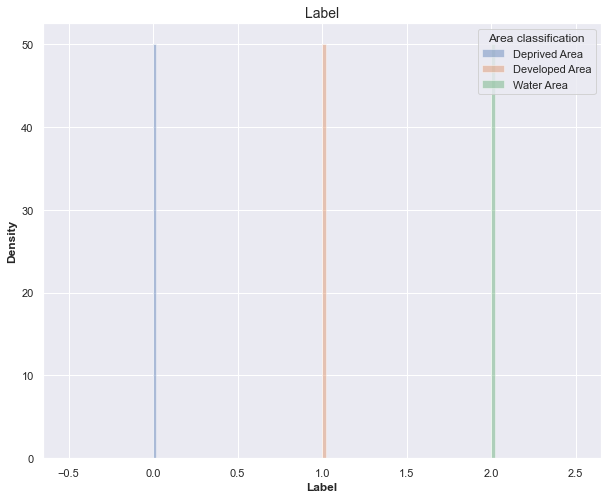

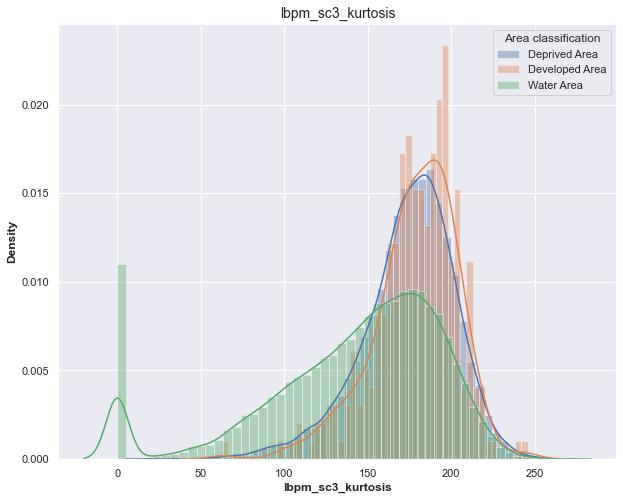

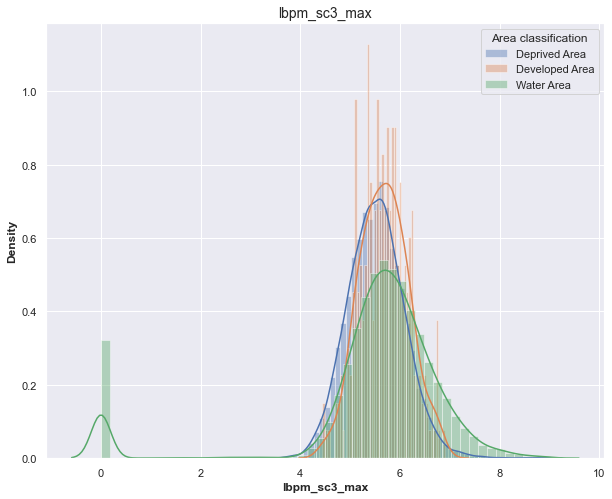

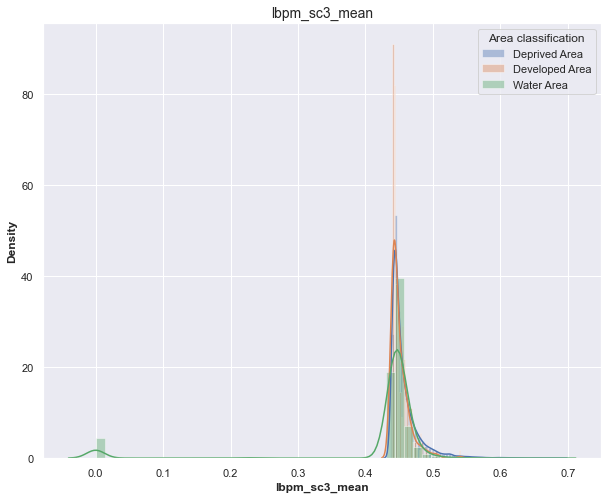

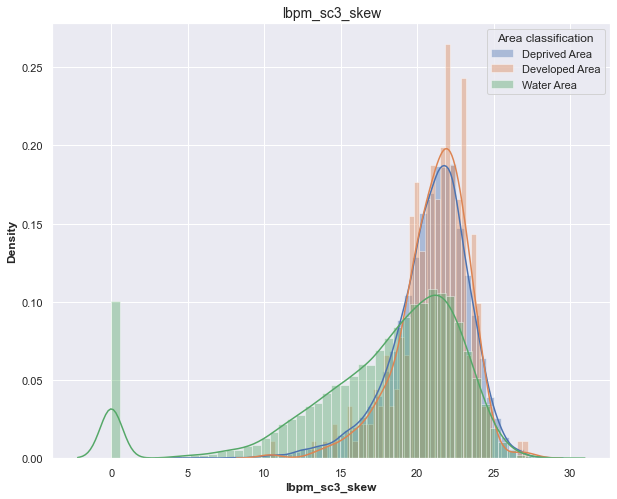

...

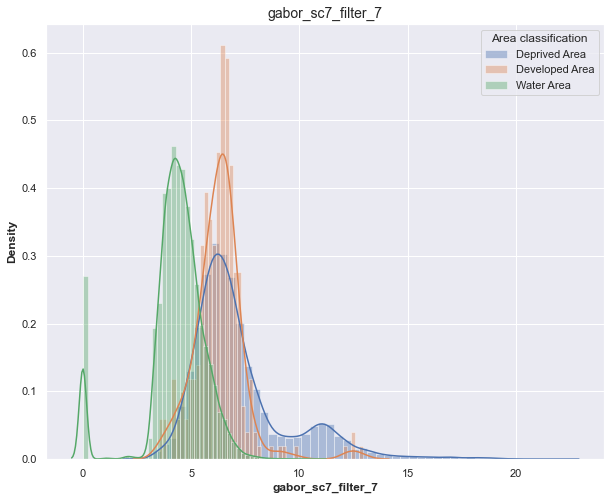

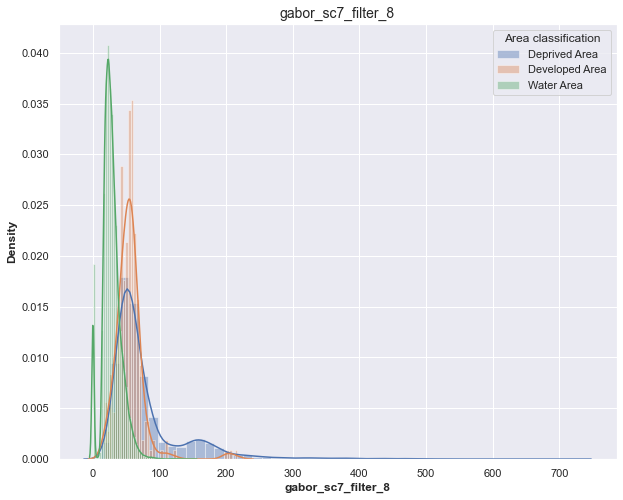

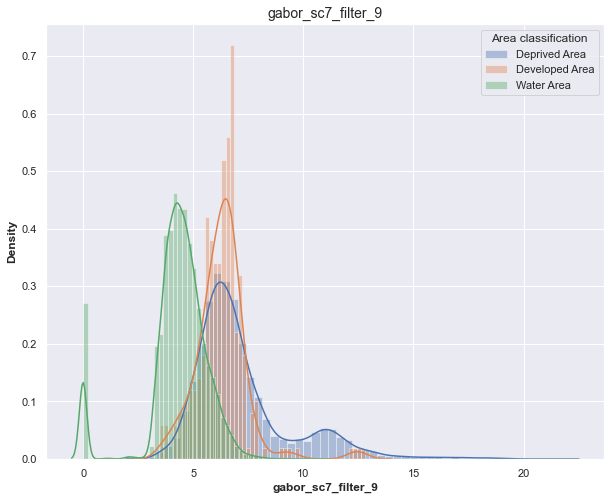

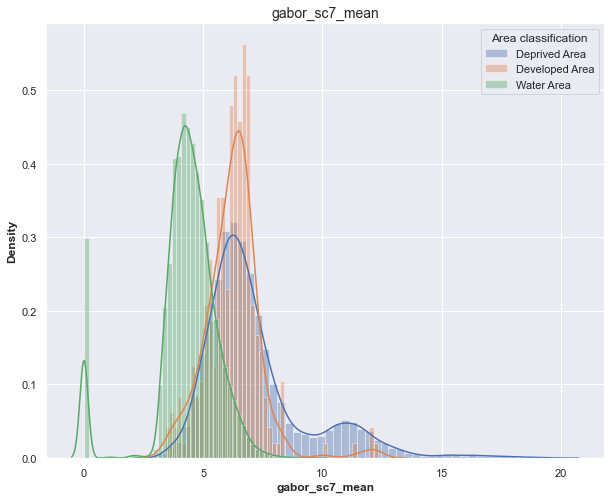

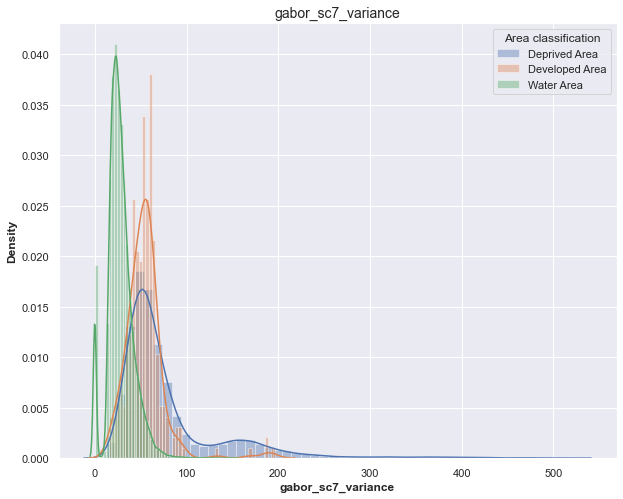

In [13]:
#created distribution plots for the variables
for i in df.columns:
    Distribution_plot(df, "{}".format(i), "Label", "{}".format(i), "{}".format(i))

In [51]:
#heat map on Contextual Features
plt.figure(figsize=(150, 150))
plt.title('Correlation Heat Map of Contextual Features', fontsize= 250)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='YlOrRd', square=True)
plt.tight_layout()
plt.show()

In [52]:
df.corr()



,Label,lbpm_sc3_kurtosis,lbpm_sc3_max,lbpm_sc3_mean,lbpm_sc3_skew,lbpm_sc3_variance,lbpm_sc5_kurtosis,lbpm_sc5_max,lbpm_sc5_mean,lbpm_sc5_skew,lbpm_sc5_variance,lbpm_sc7_kurtosis,lbpm_sc7_max,lbpm_sc7_mean,lbpm_sc7_skew,lbpm_sc7_variance,lsr_sc31_line_contrast,lsr_sc31_line_length,lsr_sc31_line_mean,lsr_sc51_line_contrast,lsr_sc51_line_length,lsr_sc51_line_mean,lsr_sc71_line_contrast,lsr_sc71_line_length,lsr_sc71_line_mean,ndvi_sc3_mean,ndvi_sc3_variance,ndvi_sc5_mean,ndvi_sc5_variance,ndvi_sc7_mean,ndvi_sc7_variance,orb_sc31_kurtosis,orb_sc31_max,orb_sc31_mean,orb_sc31_skew,orb_sc31_variance,orb_sc51_kurtosis,orb_sc51_max,orb_sc51_mean,orb_sc51_skew,orb_sc51_variance,orb_sc71_kurtosis,orb_sc71_max,orb_sc71_mean,orb_sc71_skew,...,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance
Label,1.000000,-0.302913,-0.000131,-0.175409,-0.291976,0.152828,-0.351445,0.033324,-0.140048,-0.343722,0.203280,-0.372669,0.027482,-0.139744,-0.361219,0.210244,-0.190593,-0.183735,-0.301977,-0.208727,-0.204289,-0.331844,-0.208601,-0.204163,-0.340996,0.622293,0.014125,0.623202,0.631178,0.624330,0.635965,-0.098346,-0.121093,-0.113488,-0.108129,-0.094980,-0.106271,-0.163028,-0.156348,-0.108857,-0.129710,-0.116069,-0.196946,-0.188177,-0.119851,...,-0.462915,-0.605737,-0.463255,-0.463098,-0.607940,-0.463839,-0.607739,-0.462111,-0.607392,-0.461091,-0.606925,-0.607703,-0.462439,-0.610990,-0.556867,-0.606453,-0.555769,-0.604331,-0.554612,-0.559646,-0.611032,-0.559730,-0.610347,-0.559054,-0.609339,-0.557974,-0.608150,-0.610333,-0.558963,-0.612859,-0.555919,-0.605419,-0.554839,-0.599582,-0.551272,-0.561298,-0.613681,-0.562499,-0.611668,-0.560160,-0.609011,-0.556508,-0.608049,-0.611017,-0.559045
lbpm_sc3_kurtosis,-0.302913,1.000000,0.234416,0.630168,0.987063,-0.188746,0.925408,0.153702,0.621220,0.944772,-0.305484,0.861937,0.158683,0.627327,0.892688,-0.319740,0.521962,0.506890,0.499272,0.570476,0.562244,0.512207,0.590439,0.583563,0.516353,-0.092060,0.291008,-0.091413,-0.186097,-0.090555,-0.195385,0.024268,0.033574,0.030462,0.026666,0.025665,0.032014,0.047329,0.044131,0.033352,0.035816,0.041436,0.059643,0.054904,0.042587,...,0.294127,0.582054,0.294013,0.292515,0.580381,0.294095,0.580584,0.293928,0.580879,0.292981,0.581259,0.580420,0.291436,0.577272,0.355652,0.581283,0.356826,0.582300,0.357370,0.354610,0.577886,0.355501,0.578122,0.355363,0.578587,0.355028,0.579744,0.577065,0.353899,0.571670,0.350668,0.579791,0.354674,0.581302,0.355280,0.349718,0.573970,0.352672,0.573489,0.350926,0.572774,0.348006,0.575867,0.569805,0.346775
lbpm_sc3_max,-0.000131,0.234416,1.000000,0.798892,0.316944,0.869103,0.011108,0.982738,0.852295,0.094093,0.797667,-0.054632,0.965397,0.853188,0.020136,0.775498,0.334817,0.335704,0.158137,0.506267,0.507900,0.225102,0.594172,0.595695,0.271695,0.502759,0.070641,0.503177,0.437870,0.503734,0.437511,-0.009512,-0.017206,-0.016312,-0.011294,-0.013656,-0.004360,-0.015825,-0.016861,-0.005437,-0.013537,-0.000230,-0.015009,-0.017091,-0.000440,...,-0.029870,0.272215,-0.029553,-0.029733,0.271842,-0.030055,0.271802,-0.030232,0.271892,-0.030472,0.271958,0.271908,-0.029715,0.272264,0.048220,0.273172,0.049159,0.273490,0.049159,0.047924,0.272348,0.048381,0.272288,0.047898,0.27

# Splitting and standardizing data for analysis

In [53]:
# seperate independent and dependent variables
# removed ph_gdmhz_2005 as it had nan values 
X = df.drop(['Label'], axis=1)
y = df['Label']
# train, val, test split 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

#create X_train_PCA dataframe for feature selection in PCA
X_train_PCA = X_train.copy()

In [54]:
# Standardize Features for training and test set
# The StandardScaler
ss = StandardScaler()
# Standardize the training data
X_train = ss.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train, columns= X.columns)
# Standardize Validation data
X_val = ss.fit_transform(X_val)
X_val_scaled = pd.DataFrame(X_val, columns= X.columns)
#Standardize Testing data
X_test = ss.fit_transform(X_test)
X_test_scaled = pd.DataFrame(X_test, columns= X.columns)

In [55]:
# Check shape of split data 
print('There are', X_train_scaled.shape[0], 'rows in the train data')
print('There are', X_val_scaled.shape[0], 'rows in the validation data')
print('There are', X_test_scaled.shape[0], 'rows in the test data')

There are 28536 rows in the train data
There are 9512 rows in the validation data
There are 9512 rows in the test data


In [56]:
# Make directory to save results 
directory = os.path.dirname('result/cv_results/GridSearchCV/')
if not os.path.exists(directory):
    os.makedirs(directory)

# Random Forest Model with Test Data

# For Classes 0 and 1

# Splitting and standardizing data for analysis

In [57]:
# select 0 and 1 classes
df =df[df['Label'].isin([0,1])]
X = df.drop('Label', axis=1)
y = df['Label']
# train, val, test split 60/20/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [58]:
# create pie chart data
pie_data= count_values_in_column(df,"Label") # save data aS a dataframe
count_values_in_column(df,"Label")

,Total,Percentage
0,15202,98.26
1,269,1.74


<function matplotlib.pyplot.show(close=None, block=None)>

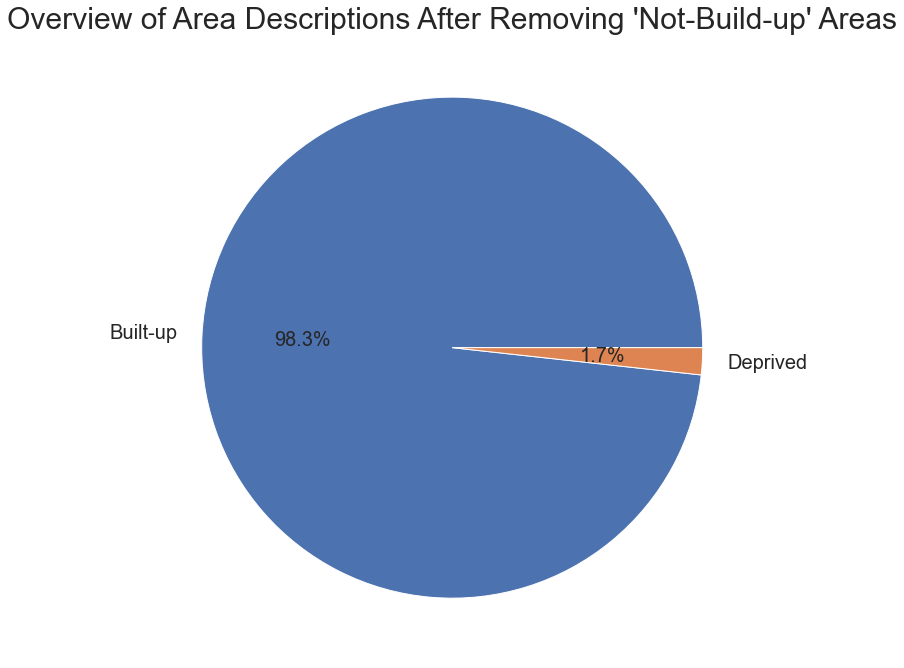

In [59]:
plt.figure(figsize= (10,10))
labels = ['Built-up', 'Deprived']
plt.title("Overview of Area Descriptions After Removing 'Not-Build-up' Areas", fontsize=30)
plt.pie(pie_data['Total'], labels=labels, autopct='%1.1f%%', textprops={'fontsize': 20})
plt.rcParams["axes.labelweight"] = "bold"
plt.tight_layout()
plt.show

In [60]:
# Standardize Features for training and test set
# The StandardScaler
ss = StandardScaler()
# Standardize the training data
X_train = ss.fit_transform(X_train)
X_train_scaled = pd.DataFrame(X_train, columns= X.columns)
# Standardize Validation data
X_val = ss.fit_transform(X_val)
X_val_scaled = pd.DataFrame(X_val, columns= X.columns)
#Standardize Testing data
X_test = ss.fit_transform(X_test)
X_test_scaled = pd.DataFrame(X_test, columns= X.columns)

In [61]:
# Check shape of split data 
print('There are', X_train_scaled.shape[0], 'rows in the train data')
print('There are', X_val_scaled.shape[0], 'rows in the validation data')
print('There are', X_test_scaled.shape[0], 'rows in the test data')

There are 9282 rows in the train data
There are 3094 rows in the validation data
There are 3095 rows in the test data


# Random Forest Model with Test Data

In [63]:
models = {'rfc': RandomForestClassifier( random_state=42)}
pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}
# Random Forest Hyper Parameters
# The grids for min_samples_split
min_samples_split_grids = [2,10, 20, 50, 100]

# The grids for min_samples_leaf
min_samples_leaf_grids = [1,10, 20, 50, 100]

# Update param_grids
param_grids['rfc'] = [{'model__min_samples_split': min_samples_split_grids,
                       'model__min_samples_leaf': min_samples_leaf_grids}]

In [64]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train_scaled, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym + '.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.508573,"{'model__min_samples_leaf': 1, 'model__min_sam...","((DecisionTreeClassifier(max_features='auto', ..."


In [65]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]


In [66]:
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9796445880452342, 0.0]","[1.0, 0.0]","[0.9897176432185408, 0.0]"


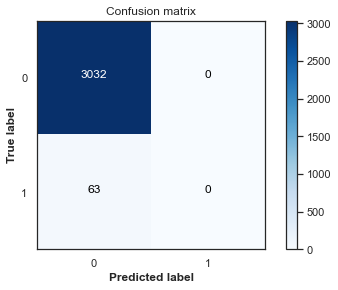

In [67]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [68]:
print(classification_report(y_test,y_test_pred))



              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3032
           1       0.00      0.00      0.00        63

    accuracy                           0.98      3095
   macro avg       0.49      0.50      0.49      3095
weighted avg       0.96      0.98      0.97      3095



In [69]:
target="label"
# Get the best_score, best_param and best_estimator of random forest obtained by GridSearchCV
best_score_rfc, best_param_rfc, best_estimator_rfc = best_score_params_estimator_gs[0]

# Get the dataframe of feature and importance
df_fi_rfc_0_1 = pd.DataFrame(np.hstack((np.setdiff1d(X.columns, [target]).reshape(-1, 1), best_estimator_rfc.named_steps['model'].feature_importances_.reshape(-1, 1))),
                         columns=['Features', 'Importance'])

# Sort df_fi_rfc in descending order of the importance
df_fi_rfc_0_1 = df_fi_rfc_0_1.sort_values(ascending=False, by='Importance').reset_index(drop=True)

# Print the first 5 rows of df_fi_rfc
df_fi_rfc_0_1.head()

#save results as csv
df_fi_rfc_0_1.to_csv(path_or_buf='feature_selection/Contextual_features/' + 'Contextual_best_random_forest_features_0_1.csv',index=False)

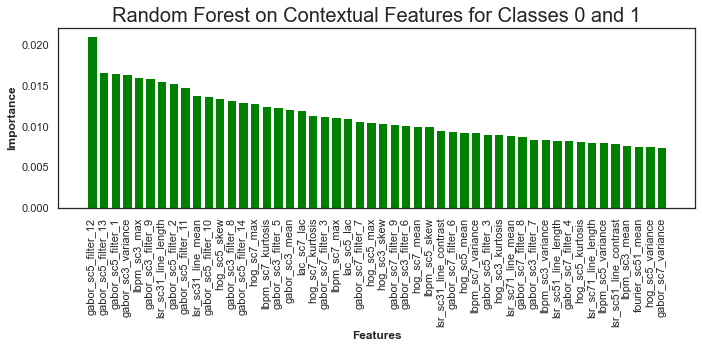

In [70]:
#Create a figure
fig = plt.figure(figsize=(10, 5))

# Implement me
# The bar plot of the top 5 feature importance
plt.bar(df_fi_rfc_0_1['Features'][:50], df_fi_rfc_0_1['Importance'][:50], color='green')

# Set x-axis
plt.title('Random Forest on Contextual Features for Classes 0 and 1', fontsize=20)
plt.xlabel('Features')
plt.xticks(rotation=90)

# Set y-axis
plt.ylabel('Importance')

# Save and show the figure
plt.tight_layout()
plt.show()

# Random Forest Model with Validation Data

In [71]:
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9838292367399741, 1.0]","[1.0, 0.038461538461538464]","[0.9918487120965113, 0.07407407407407407]"


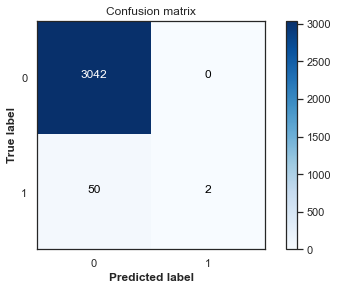

In [72]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [73]:
print(classification_report(y_val,y_val_pred))



              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3042
           1       1.00      0.04      0.07        52

    accuracy                           0.98      3094
   macro avg       0.99      0.52      0.53      3094
weighted avg       0.98      0.98      0.98      3094



# Logistic Model Building with no Balanced Classes on Testing Data

In [74]:
# manually set weights
models = {'lr': LogisticRegression(solver= "lbfgs", random_state=42)}


pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]


In [75]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=-1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym +  'stratifiedCV.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.513642,"{'model__C': 1, 'model__tol': 1e-05}","(LogisticRegression(C=1, random_state=42, tol=..."


In [76]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_test_pred = best_estimator_gs.predict(X_test_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_test_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9796445880452342, 0.0]","[1.0, 0.0]","[0.9897176432185408, 0.0]"


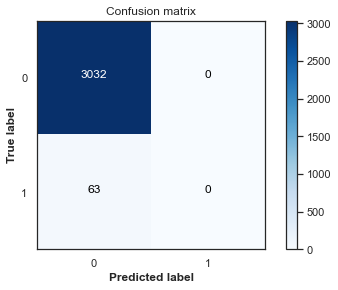

In [77]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_test,y_test_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [78]:
 print(classification_report(y_test,y_test_pred))

    

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3032
           1       0.00      0.00      0.00        63

    accuracy                           0.98      3095
   macro avg       0.49      0.50      0.49      3095
weighted avg       0.96      0.98      0.97      3095



# Logistic Model Building with no Balanced Classes on Validation Data

In [79]:
# manually set weights
models = {'lr': LogisticRegression(solver= "lbfgs", random_state=42)}


pipes = {}

for acronym, model in models.items():
    pipes[acronym] = Pipeline([('model', model)])
param_grids = {}

# Logistic Regression hyperparamters

# The parameter grid of tol
tol_grid = [10 ** -5, 10 ** -4, 10 ** -3, 10 ** -2, 10 ** -1]

# The parameter grid of C
C_grid = [0.001, 0.0001, 0.1, 1, 10]

param_grids['lr'] = [{'model__tol': tol_grid,
                      'model__C': C_grid}]


In [80]:
# The list of [best_score_, best_params_, best_estimator_] obtained by GridSearchCV
best_score_params_estimator_gs = []
# GridSearchCV
gs = GridSearchCV(estimator=pipes[acronym],
                      param_grid=param_grids[acronym],
                      scoring='f1_macro',
                      n_jobs=-1,
                      cv=StratifiedKFold(),
                      return_train_score=True)
        
# Fit the pipeline
gs = gs.fit(X_train, y_train)
    
# Update best_score_params_estimator_gs
best_score_params_estimator_gs.append([gs.best_score_, gs.best_params_, gs.best_estimator_])
    
# Sort cv_results in ascending order of 'rank_test_score' and 'std_test_score'
cv_results = pd.DataFrame.from_dict(gs.cv_results_).sort_values(by=['rank_test_score', 'std_test_score'])
    
# Get the important columns in cv_results
important_columns = ['rank_test_score',
                         'mean_test_score', 
                         'std_test_score', 
                         'mean_train_score', 
                         'std_train_score',
                         'mean_fit_time', 
                         'std_fit_time',                        
                         'mean_score_time', 
                         'std_score_time']
    
# Move the important columns ahead
cv_results = cv_results[important_columns + sorted(list(set(cv_results.columns) - set(important_columns)))]

# Write cv_results file
cv_results.to_csv(path_or_buf='result/cv_results/GridSearchCV/' + acronym +  'stratifiedCV.csv', index=False)

# Sort best_score_params_estimator_gs in descending order of the best_score_
best_score_params_estimator_gs = sorted(best_score_params_estimator_gs, key=lambda x : x[0], reverse=True)

# Print best_score_params_estimator_gs
pd.DataFrame(best_score_params_estimator_gs, columns=['best_score', 'best_param', 'best_estimator'])

,best_score,best_param,best_estimator
0,0.513642,"{'model__C': 1, 'model__tol': 1e-05}","(LogisticRegression(C=1, random_state=42, tol=..."


In [81]:
best_score_gs, best_params_gs, best_estimator_gs = best_score_params_estimator_gs[0]
# Predict using test data
y_val_pred = best_estimator_gs.predict(X_val_scaled)

# Get the precision, recall, fscore, support
precision, recall, fscore, support = precision_recall_fscore_support(y_val, y_val_pred)


# Get the dataframe of precision, recall, fscore and auc
pd.DataFrame([[precision, recall, fscore]], columns=['Precision', 'Recall', 'F1-score'])

,Precision,Recall,F1-score
0,"[0.9838292367399741, 1.0]","[1.0, 0.038461538461538464]","[0.9918487120965113, 0.07407407407407407]"


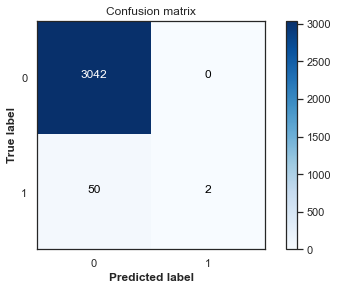

In [82]:
# Plotting confusion matrix obtained from the testing data predictions
sns.set(style="white")
cnf_matrix = confusion_matrix(y_val,y_val_pred)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
class_names = ["0","1"]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

In [83]:
 print(classification_report(y_val,y_val_pred))


              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3042
           1       1.00      0.04      0.07        52

    accuracy                           0.98      3094
   macro avg       0.99      0.52      0.53      3094
weighted avg       0.98      0.98      0.98      3094



In [84]:
# Evaluate odds of each variable and sort by odds value
odds = np.exp(best_estimator_gs["model"].coef_[0])
best_log =pd.DataFrame(odds, X_train_scaled.columns, columns=['odds']).sort_values(by='odds', ascending=False)
best_log.reset_index(inplace=True)
best_log.rename(columns={'index':'Contextual_features','odds':'values'},inplace=True)
best_log.head()

,Contextual_features,values
0,fourier_sc31_mean,2.582292
1,sfs_sc51_max_line_length,2.166072
2,sfs_sc71_std,2.056901
3,mean_sc3_variance,1.908998
4,lsr_sc71_line_contrast,1.826235


In [85]:
#save best logistic features in csv file
best_log.to_csv(path_or_buf='feature_selection/Contextual_features/' + 'Contextual_best_logistic_features_0_1.csv',index=False)



# PCA Feature Selection- class 0 and 1

In [58]:
from sklearn.decomposition import PCA
pca = PCA() # estimate only 2 PCs
X_new = pca.fit_transform(X_train_scaled)

In [59]:
total_explained_variance = pca.explained_variance_ratio_.cumsum()
n_over_95 = len(total_explained_variance[total_explained_variance >= .95])
n_to_reach_95 = abs(X_new.shape[1] - n_over_95 + 1)
print("Number features: {}\tTotal Variance Explained: {}".format(n_to_reach_95, total_explained_variance[n_to_reach_95-1]))

Number features: 23	Total Variance Explained: 0.9533728810174212


In [60]:
#create pipe line for selecting features
pipe = Pipeline([('scaler', StandardScaler()),
 ('pca', PCA(n_components=60,random_state=42)),
 ('clf', RandomForestClassifier())])
pipe.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('pca', PCA(n_components=60, random_state=42)),
                ('clf', RandomForestClassifier())])

In [61]:
#show cumulative variance explained for first 23 components
pca.explained_variance_ratio_.cumsum()[0:23]

array([0.46, 0.57, 0.64, 0.68, 0.72, 0.74, 0.77, 0.79, 0.81, 0.83, 0.84,
       0.86, 0.87, 0.88, 0.9 , 0.91, 0.92, 0.92, 0.93, 0.94, 0.94, 0.95,
       0.95])

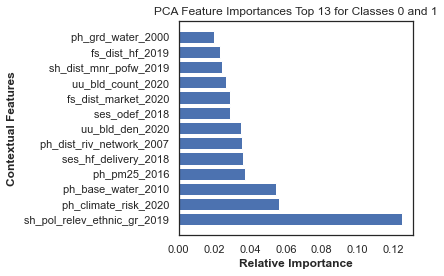

In [64]:
model = pipe.steps[1][1]
n_pcs= model.components_.shape[0]
initial_feature_names = X_train_scaled.columns
# loop through the absolute value of 60 pca components in model and select the largest value
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)] 
# create list of most important features
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
# run values through random forest to extract feature importance 
zipped_feats = zip(most_important_names, pipe.steps[2][1].feature_importances_)
#sort feature importance values
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=True)
features, importances = zip(*zipped_feats)
top_features = features[:13]
top_importances = importances[:13]
plt.figure()
plt.title('PCA Feature Importances Top 13 for Classes 0 and 1')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

In [65]:
#Convert top features into a dataframe
top_pca_names_0_1 = pd.DataFrame(features)
top_pca_values_0_1 = pd.DataFrame(importances)
top_pca_0_1 = top_pca_names_0_1.merge(top_pca_values_0_1, left_index=True,right_index=True)
top_pca_0_1= top_pca_0_1.rename(columns={'0_x':'names','0_y':'values'})
top_pca_0_1.to_csv(path_or_buf='feature_selection/Contextual_features/' + 'Contextual_best_pca_features_0_1.csv',index=False)
top_pca_0_1.head()

,names,values
0,sh_pol_relev_ethnic_gr_2019,0.124968
1,ph_climate_risk_2020,0.056185
2,ph_base_water_2010,0.054468
3,ph_pm25_2016,0.037145
4,ses_hf_delivery_2018,0.036120


In [66]:
# 13 values are repeated
top_pca_0_1.names.duplicated().value_counts()

False    47
True     13
Name: names, dtype: int64

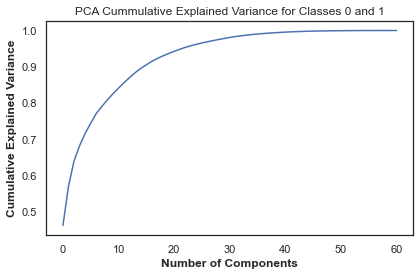

In [67]:
#plot cummulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA Cummulative Explained Variance for Classes 0 and 1')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.tight_layout()
plt.show()

In [50]:
# use list comprehension to find most useful variable within each principle component
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
ef = pd.DataFrame(dic.items(), columns = ['Component','Contextual_features'])

NameError: name 'n_pcs' is not defined

# Comparing Feature Selections of Different Models

In [86]:
# Random Forest feature importance two classes
df_fi_rfc_0_1 = df_fi_rfc_0_1.rename(columns = {'Features':'Contextual_features','Importance':'values'})
df_fi_rfc_0_1['top_Random_Forest_0_1']= range(1,len(df_fi_rfc_0_1)+1)
df_fi_rfc_0_1.drop(['values'],axis=1, inplace=True)

# logisitc featue importance for two classes
best_log['top_logistic_0_1'] = range(1,len(best_log)+1)
best_log.drop(['values'],axis=1, inplace=True)
best_log.head()

,Contextual_features,top_logistic_0_1
0,fourier_sc31_mean,1
1,sfs_sc51_max_line_length,2
2,sfs_sc71_std,3
3,mean_sc3_variance,4
4,lsr_sc71_line_contrast,5


In [87]:
# Top PCA Features three classes
top_pca['top_PCA']= range(1,len(top_pca)+1)
top_pca = top_pca.rename(columns = {'names':'Contextual_features'})


# Top PCA Features two classes
top_pca_0_1['top_PCA_0_1']= range(1,len(top_pca_0_1)+1)
top_pca_0_1 = top_pca_0_1.rename(columns = {'names':'Contextual_features'})


top_pca.head(10)

NameError: name 'top_pca' is not defined

In [90]:
top_pca['top_PCA']= range(1,len(top_pca)+1)
top_pca = top_pca.rename(columns = {'names':'Contextual_features'})

top_pca.iloc[8]
top_pca.head()

NameError: name 'top_pca' is not defined

In [91]:
best_log.head()

,Contextual_features,top_logistic_0_1
0,fourier_sc31_mean,1
1,sfs_sc51_max_line_length,2
2,sfs_sc71_std,3
3,mean_sc3_variance,4
4,lsr_sc71_line_contrast,5


In [92]:
#merge best featurees 
best = best_log.merge(df_fi_rfc_0_1[['Contextual_features','top_Random_Forest_0_1']],how='inner', on = 'Contextual_features')

#create rank column
best['overall_rank'] = best['top_logistic_0_1'] + best['top_Random_Forest_0_1'] 

best = best.sort_values(by= ['overall_rank'], ascending =True).reset_index(drop=True)
best['rank']= range(1,len(best)+1)
best.head(20)

,Contextual_features,top_logistic_0_1,top_Random_Forest_0_1,overall_rank,rank
0,gabor_sc3_variance,23,4,27,1
1,lbpm_sc7_max,7,22,29,2
2,hog_sc3_skew,10,26,36,3
3,gabor_sc5_filter_11,28,9,37,4
4,gabor_sc7_filter_7,18,24,42,5
5,gabor_sc7_filter_9,17,27,44,6
6,lac_sc7_lac,26,19,45,7
7,lbpm_sc7_kurtosis,31,16,47,8
8,hog_sc5_mean,15,33,48,9
9,gabor_sc5_filter_13,48,2,50,10
